In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from os.path import exists
from hashlib import sha256

from utils_fit import get_anchors_and_scores_mean_curve, convert_table2, remove_rows_with_nan_or_inf, load_from_parts, remove_bad_fits, failed_fits_statistics,  prepare_total_dataframe, plot_data2, plot_trn_data2, plot_prediction2, plot_prediction_smooth2, get_fun_model_id, get_XY2, get_ranks_from_tables, build_rank_table, convert_to_cd_tables, filter_table, prepare_data_for_cd, make_all_cd_plots, print_pretty_rank_table_transpose, plot_metric, get_relevant_max_anchor, empirical_cdf
from fit_database import fit_model, get_multiple_extrapolations_mean_curve_robust, df_compute_metrics_mean_curve

dir_plots = 'plots'
dir_fitting_results = 'fitting_results'

# Installing required packages

Please install the required packages with exact version numbers, otherwise you will not be able to unpickle the author provided results. In your terminal:

```conda env create -f env_3b.yml```
```conda activate lcfit```

Afterward, launch your IDE or jupyter notebook / lab, and open this notebook. Make sure the correct kernel is loaded in your IDE / notebook / jupyter lab.

# Before running

The whole learning curve database needs to be fitted. This takes around 13 hours. You can do this with the script ```fit_database.py``` (parallelizeable for running on a compute cluster). Or you can load the author provided results, the directory that contains them should be in ```dir_fitting_results```. The path ```dir_plots``` is the directory where all plots will be stored. The file ```database-accuracy.csv``` should be in the same directory as this jupyter notebook (you can find this file in ```/python/lcdb/database.tar.7z```).

# Preprocessing
The data was spread over multiple files. Here, we load the different dataframes and combine them into 1 big dataframe called ``df_total``.

In [2]:
fn_df_total = dir_fitting_results + '/df_total.gz'
if exists(fn_df_total):
    df_total = pd.read_pickle(fn_df_total)
else:
    [df_anchors_and_scores, df_metrics, df_extrapolations] = load_from_parts(dir_fitting_results)
    df_total = prepare_total_dataframe(df_anchors_and_scores, df_metrics, df_extrapolations)
    df_total.to_pickle(fn_df_total, protocol=3)

In [3]:
df_total

,openmlid,learner,max_anchor_seen,prediction,beta,fails_init,fails_fit,MSE_trn,MSE_tst,MSE_tst_last,L1_trn,L1_tst,L1_tst_last,n,curve_model,anchor_prediction,score,percentage,percentage_bucket
0,3,SVC_linear,45,"[0.6871956991987469, 0.7358084251013678, 0.779...","[0.9598296244047068, 59.680528820373155, 1.402...",0,0,5.960944e-07,0.000035,1.143541e-04,5.960944e-07,0.000035,1.143541e-04,4,pow4,"[16, 23, 32, 45, 64, 91, 128, 181, 256, 362, 5...","[0.6874968, 0.7347776000000005, 0.7807, 0.8211...",0.017388,0.05
1,3,SVC_linear,64,"[0.6872896613831692, 0.7356441516353385, 0.779...","[1.0179906696870171, 7.256424514473532, 0.8682...",0,0,6.533791e-07,0.000904,1.646775e-03,6.533791e-07,0.000904,1.646775e-03,5,pow4,"[16, 23, 32, 45, 64, 91, 128, 181, 256, 362, 5...","[0.6874968, 0.7347776000000005, 0.7807, 0.8211...",0.024730,0.05
2,3,SVC_linear,91,"[0.6873537192715493, 0.7353498699373091, 0.779...","[0.9445764062845252, 1363.9883503403375, 2.047...",0,0,8.374107e-07,0.000273,6.312668e-04,8.374107e-07,0.000273,6.312668e-04,6,pow4,"[16, 23, 32, 45, 64, 91, 128, 181, 256, 362, 5...","[0.6874968, 0.7347776000000005, 0.7807, 0.8211...",0.035162,0.05
3,3,SVC_linear,128,"[0.6872911910981312, 0.7354931231290397, 0.779...","[0.9560185541622583, 191.79840215690183, 1.641...",0,0,8.702641e-07,0.000074,1.964009e-04,8.702641e-07,0.000074,1.964009e-04,7,pow4,"[16, 23, 32, 45, 64, 91, 128, 181, 256, 362, 5...","[0.6874968, 0.7347776000000005, 0.7807, 0.8211...",0.049459,0.05
4,3,SVC_linear,181,"[0.6870080420321716, 0.7359803560370154, 0.779...","[0.9755968843816757, 22.420258498280724, 1.173...",0,0,1.250014e-06,0.000031,1.478424e-05,1.250014e-06,0.000031,1.478424e-05,8,pow4,"[16, 23, 32, 45, 64, 91, 128, 181, 256, 362, 5...","[0.6874968, 0.7347776000000005, 0.7807, 0.8211...",0.069938,0.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56699,42810,sklearn.tree.ExtraTreeClassifier,512,"[0.560029047279258, 0.570685192188439, 0.57892...","[0.6227277698223692, -1.1012620606535517, -0.5...",0,0,3.316475e-05,0.000105,8.197082e-05,3.316475e-05,0.000105,8.197082e-05,11,logpower3,"[16, 23, 32, 45, 64, 91, 128, 181, 256, 362, 5...","[0.552324, 0.58366, 0.5775560000000001, 0.5879...",0.158025,0.20
56700,42810,sklearn.tree.ExtraTreeClassifier,724,"[0.5617138840082235, 0.5706583863625894, 0.577...","[0.6393550251902412, -2.4240554174606306, -0.3...",0,0,3.465686e-05,0.000019,2.176908e-07,3.465686e-05,0.000019,2.176908e-07,12,logpower3,"[16, 23, 32, 45, 64, 91, 128, 181, 256, 362, 5...","[0.552324, 0.58366, 0.5775560000000001, 0.5879...",0.223457,0.40
56701,42810,sklearn.tree.ExtraTreeClassifier,1024,"[0.5614041204696746, 0.5706310423885999, 0.578...","[0.6358449159894225, -2.1605289247399133, -0.4...",0,0,3.215084e-05,0.000035,3.711369e-06,3.215084e-05,0.000035,3.711369e-06,13,logpower3,"[16, 23, 32, 45, 64, 91, 128, 181, 256, 362, 5...","[0.552324, 0.58366, 0.5775560000000001, 0.5879...",0.316049,0.40
56702,42810,sklearn.tree.ExtraTreeClassifier,1448,"[0.5625330323470663, 0.570808634126051, 0.5777...","[0.6488834961976416, -3.1233514029712626, -0.3...",0,0,3.225755e-05,0.000008,6.971066e-06,3.225755e-05,0.000008,6.971066e-06,14,logpower3,"[16, 23, 32, 45, 64, 91, 128, 181, 256, 362, 5...","[0.552324, 0.58366, 0.5775560000000001, 0.5879...",0.446914,0.80


The meaning of the columns are:
- openmlid: the dataset
- learner: the learner used for the classification task (e.g. SVM, etc.)
- max_anchor_seen: the largest training set point on the averaged learning curve used for fitting the curve model
- anchor_prediction: the x-values on the learning curve (the training set sizes)
- score: the y-values on the learning curve (the accuracy of the learner), note that this is an average over multiple learning curves
- n: number of points on the curve used for fitting the learning curve model
- max_anchor_seen: the largest training set size used in curve fitting
- percentage: the percentage of points used (compared to the total on the curve) used for fitting
- percentage_bucket: a discretized version of the percentage, values are 0.05, 0.10, 0.20, 0.40, 0.80, 1.0.
- curve_model: the curve model that we attempted to fit
- fails_init: how many initial points needed to be tried during the fitting procedure
- fails_fit: how many times the fitting failed
- beta: the parameters of the best fit on the training points on the curve (out of 5 or more fitting attempts)
- MSEs: the MSE on either the training points of the curve (trn), MSE on the testing points on the curve (tst), MSE on the last point on the curve (tst last)
- L1: the same, but then for the L1 (absolute loss)

# Visualize a learning curve and the fit
Here we grab a random learning curve from the database and visualize the fit. Note that the dataframe contains accuracies, but we convert these to error rates in the plot.

visualizing the curve fit of row number 103343


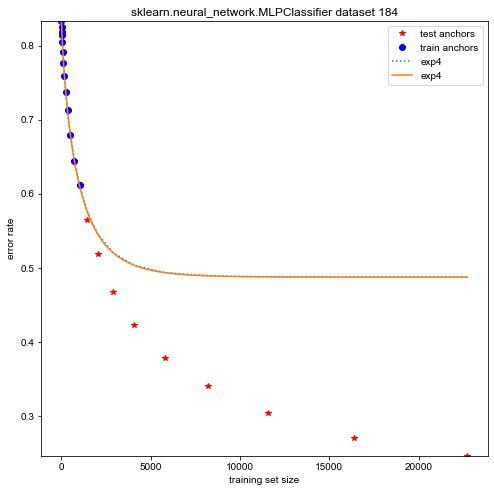

openmlid                                                           184
learner                           sklearn.neural_network.MLPClassifier
max_anchor_seen                                                   1024
prediction           [0.16934205891561632, 0.17402395284589073, 0.1...
beta                 [0.004915695956462296, -1.0269664444612965, 0....
fails_init                                                           0
fails_fit                                                            0
MSE_trn                                                       0.000002
MSE_tst                                                       0.020532
MSE_tst_last                                                    0.0582
L1_trn                                                        0.000002
L1_tst                                                        0.020532
L1_tst_last                                                     0.0582
n                                                                   13
curve_

In [4]:
num = np.random.randint(0,len(df_total))
row = df_total.iloc[num,:]

print('visualizing the curve fit of row number %d' % num)

plt.figure(figsize=(8,8))

# plots all the points on the curve (red stars)
plot_data2(row)

# plots the points used for training only (blue dots)
plot_trn_data2(row)

# plot the curve fit from the row of the dataframe (dotted)
plot_prediction2(row)

# plot the curve fit using the beta parameters in the dataframe (line)
# this plot is smoother since we can predict any x-value
# this curve should overlap with the curve plotted previously
plot_prediction_smooth2(row)

# show the plot
plt.show()

# show the information of the row
print(row)

Let us retrieve the fitted curve model and make a new prediction:

In [5]:
fitted_curve_model = get_fun_model_id(row.beta, row.curve_model)
x_predict = row.anchor_prediction[-1]*2
y_predict = fitted_curve_model(x_predict)
y_predict

0.5126246011839029

# Repeat the fitting procedure
Let us redo a fit to illustrate the fitting procedure.

In [6]:
# get the X and Y values
# X are training set sizes
# Y are accuracies
[X, Y] = get_XY2(row)

# we need to find the training and test set for the curve data, we do that through the offset
offset = np.argwhere(X == row.max_anchor_seen)[0][0]

# curve training data
X_trn_curve = np.array(X[:offset + 1])
Y_trn_curve = np.array(Y[:offset + 1])

# curve testing data
X_tst_curve = np.array(X[offset + 1:])
Y_tst_curve = np.array(Y[offset + 1:])

experiment_id = '%d-%s-%s-%d' % (row.openmlid,row.learner,row.curve_model,offset)

hash = sha256(experiment_id.encode())
seed = np.frombuffer(hash.digest(), dtype='uint32')
np.random.seed(seed)

# fit the curve model again
[beta_fit_new, fitted_curve_model_new, fails_init, fails_fit] = fit_model(X_trn_curve, Y_trn_curve, X_tst_curve, row.curve_model)

print('best beta found from fitting procedure:')
print(beta_fit_new)
print('the beta provided by the authors:')
print(row.beta)
#assert(beta_fit_new == row.beta)

best beta found from fitting procedure:
[ 0.00491569 -1.0269666   0.51262455  0.77574282]
the beta provided by the authors:
[ 0.0049157  -1.02696644  0.5126246   0.77574275]


# Fitting many learning curves
The code in ``fit3_students.py`` takes the file ``lcdb_new.csv`` and fits all learning curve models to all datasets. This procedure takes approximately 20-40 hours to complete. That is why ``fit_students.py`` takes as argument part: part is an integer in [0, 9]. The database is splitted in 10 parts. So if part is 0, the first 10% of the database is processed. This takes about 2-4 hours. I will not do that computation here, because it simply takes extremely long. The results of these computations are stored in ``extrapolations$i.p``, ``anchor_scores$i.p``, ``metrics$i.p``, and these were already loaded above using ``load_from_parts()``. Still, to illustrate how this process went, let us fit all curve models for a single dataset.

Let us first read the learning curve database:

In [7]:
df_performances = pd.read_csv("database-accuracy.csv")
df_performances

,openmlid,learner,size_train,size_test,outer_seed,inner_seed,traintime,score_train,score_valid,score_test
0,44,SVC_linear,16,461,0,0,0.0024,0.8750,0.7440,0.7072
1,44,SVC_linear,23,461,0,0,0.0014,0.9565,0.7222,0.6876
2,44,SVC_linear,32,461,0,0,0.0017,0.9375,0.7295,0.7180
3,44,SVC_linear,45,461,0,0,0.0023,0.9778,0.8237,0.8048
4,44,SVC_linear,64,461,0,0,0.0033,0.7812,0.6280,0.6508
...,...,...,...,...,...,...,...,...,...,...
1953366,1464,sklearn.linear_model.SGDClassifier,181,75,4,4,0.0010,0.8011,0.7647,0.7600
1953367,1464,sklearn.linear_model.SGDClassifier,256,75,4,4,0.0012,0.7734,0.7647,0.7600
1953368,1464,sklearn.linear_model.SGDClassifier,362,75,4,4,0.0015,0.7735,0.7647,0.7600
1953369,1464,sklearn.linear_model.SGDClassifier,512,75,4,4,0.0018,0.4395,0.3676,0.4533


The columns are:
- openmlid: the dataset
- learner: the learner trained
- size_train: the maximum number of training sizes used
- size_test: size of the test set
- outer_seed, inner_seed: the seeds that were used to generate the training, validation and test folds (see ECML paper for details)
- score_train: accuracy on train set
- score_valid: accuracy on validation set
- score_test: accuracy on test set

Note that in my experiments, I computed all the learning curves using the validation set, and never used the test sets.

Let us fit all learning curves for a single dataset that is relatively small, to illustrate the process:

In [8]:
df_performances_one_dataset = df_performances.query('openmlid == 1468')
df_performances_one_dataset

,openmlid,learner,size_train,size_test,outer_seed,inner_seed,traintime,score_train,score_valid,score_test
575097,1468,SVC_linear,16,108,0,0,0.0022,1.0,0.6327,0.6111
575098,1468,SVC_linear,23,108,0,0,0.0015,1.0,0.6429,0.6759
575099,1468,SVC_linear,32,108,0,0,0.0017,1.0,0.6429,0.6944
575100,1468,SVC_linear,45,108,0,0,0.0019,1.0,0.7143,0.7130
575101,1468,SVC_linear,64,108,0,0,0.0020,1.0,0.8571,0.8426
...,...,...,...,...,...,...,...,...,...,...
581037,1468,sklearn.tree.ExtraTreeClassifier,181,108,4,4,0.0011,1.0,0.6735,0.7037
581038,1468,sklearn.tree.ExtraTreeClassifier,256,108,4,4,0.0014,1.0,0.7551,0.8056
581039,1468,sklearn.tree.ExtraTreeClassifier,362,108,4,4,0.0020,1.0,0.7143,0.8148
581040,1468,sklearn.tree.ExtraTreeClassifier,512,108,4,4,0.0023,1.0,0.8469,0.8148


This code below is taken from ``do_job()`` from ``fit3_students.py``.
Note that some computations result in nans, because some of the fits are so bad, that they cause overflows or divisions by zero.
Fitting the curves, computing the metrics, and computing the X, Y values (anchors and scores mean curve) takes about 2 minutes for this dataset.

In [9]:
np.seterr(all='print')

print('computing extrapolations...')
# compute the fits
df_extrapolations = get_multiple_extrapolations_mean_curve_robust(df_performances_one_dataset)
df_extrapolations.to_pickle(dir_fitting_results + '/extrapolations_example.gz', protocol=3)

print('computing anchors and scores...')
# compute the X, Y values and store them for later use
df_anchors_and_scores = get_anchors_and_scores_mean_curve(df_performances_one_dataset)
df_anchors_and_scores.to_pickle(dir_fitting_results + '/anchors_scores_example.gz', protocol=3)

print('computing metrics....')
# compute the metrics and other information (L2 losses, etc.)
df_metrics = df_compute_metrics_mean_curve(df_extrapolations, df_anchors_and_scores)
df_metrics.to_pickle(dir_fitting_results + '/metrics_example.gz', protocol=3)

computing extrapolations...


  2%|▏         | 7/320 [00:01<01:00,  5.15it/s]

fit failed, nan error? True inf error? False model? mmf4
fit failed, nan error? True inf error? False model? mmf4


  4%|▍         | 12/320 [00:05<02:08,  2.39it/s]

initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3


  4%|▍         | 13/320 [00:05<02:11,  2.33it/s]

fit failed, nan error? True inf error? False model? expp3


  9%|▉         | 28/320 [00:13<02:20,  2.08it/s]

initial value failed, retrying for  expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3


 10%|▉         | 31/320 [00:14<02:11,  2.20it/s]

initial value failed, retrying for  expp3


 14%|█▍        | 44/320 [00:20<02:09,  2.12it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 19%|█▉        | 60/320 [00:26<01:56,  2.23it/s]

initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
initial value failed, retrying for  expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 20%|██        | 64/320 [00:27<01:50,  2.32it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 24%|██▍       | 76/320 [00:32<01:42,  2.37it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
initial value failed, retrying for  expp3


 24%|██▍       | 77/320 [00:32<01:42,  2.36it/s]

fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 27%|██▋       | 86/320 [00:35<01:35,  2.46it/s]

fit failed, nan error? True inf error? False model? mmf4
fit failed, nan error? True inf error? False model? mmf4


 29%|██▉       | 92/320 [00:38<01:35,  2.39it/s]

fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 30%|██▉       | 95/320 [00:38<01:32,  2.44it/s]

fit failed, nan error? True inf error? False model? expp3


 32%|███▏      | 103/320 [00:40<01:24,  2.56it/s]

fit failed, nan error? True inf error? False model? mmf4


 34%|███▍      | 108/320 [00:43<01:26,  2.46it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3


 37%|███▋      | 118/320 [00:46<01:19,  2.54it/s]

fit failed, nan error? True inf error? False model? mmf4


 39%|███▉      | 124/320 [00:49<01:17,  2.52it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 40%|████      | 128/320 [00:49<01:14,  2.56it/s]

initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3


 43%|████▎     | 137/320 [00:51<01:08,  2.68it/s]

fit failed, nan error? True inf error? False model? mmf4


 44%|████▍     | 140/320 [00:53<01:09,  2.59it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 44%|████▍     | 141/320 [00:54<01:09,  2.59it/s]

fit failed, nan error? True inf error? False model? expp3


 49%|████▉     | 156/320 [00:58<01:01,  2.65it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3


 52%|█████▏    | 167/320 [01:00<00:55,  2.74it/s]

fit failed, nan error? True inf error? False model? mmf4
fit failed, nan error? True inf error? False model? mmf4


 54%|█████▍    | 172/320 [01:04<00:55,  2.67it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 55%|█████▌    | 176/320 [01:05<00:53,  2.70it/s]

fit failed, nan error? True inf error? False model? expp3


 57%|█████▋    | 183/320 [01:06<00:49,  2.77it/s]

fit failed, nan error? True inf error? False model? mmf4


 59%|█████▉    | 188/320 [01:08<00:47,  2.75it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 63%|██████▎   | 202/320 [01:11<00:41,  2.82it/s]

fit failed, nan error? True inf error? False model? mmf4


 64%|██████▍   | 204/320 [01:13<00:41,  2.76it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3


 64%|██████▍   | 205/320 [01:14<00:41,  2.76it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 68%|██████▊   | 218/320 [01:16<00:35,  2.86it/s]

fit failed, nan error? True inf error? False model? mmf4


 69%|██████▉   | 220/320 [01:17<00:35,  2.83it/s]

initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 70%|███████   | 224/320 [01:18<00:33,  2.86it/s]

initial value failed, retrying for  expp3


 74%|███████▍  | 236/320 [01:26<00:30,  2.74it/s]

initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3


 74%|███████▍  | 237/320 [01:26<00:30,  2.73it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 77%|███████▋  | 247/320 [01:28<00:26,  2.78it/s]

fit failed, nan error? True inf error? False model? mmf4


 79%|███████▉  | 252/320 [01:30<00:24,  2.77it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3


 79%|███████▉  | 253/320 [01:31<00:24,  2.77it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 84%|████████▍ | 268/320 [01:34<00:18,  2.83it/s]

fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3


 84%|████████▍ | 269/320 [01:35<00:18,  2.82it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3


 87%|████████▋ | 278/320 [01:36<00:14,  2.87it/s]

fit failed, nan error? True inf error? False model? mmf4


 89%|████████▉ | 284/320 [01:40<00:12,  2.82it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 90%|█████████ | 288/320 [01:41<00:11,  2.85it/s]

fit failed, nan error? True inf error? False model? expp3


 94%|█████████▍| 300/320 [01:46<00:07,  2.83it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
initial value failed, retrying for  expp3


 99%|█████████▉| 316/320 [01:51<00:01,  2.83it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


 99%|█████████▉| 317/320 [01:52<00:01,  2.82it/s]

fit failed, nan error? True inf error? False model? expp3
fit failed, nan error? True inf error? False model? expp3


100%|██████████| 320/320 [01:52<00:00,  2.85it/s]

computing anchors and scores...


  0%|          | 0/1 [00:00<?, ?it/s]

computing metrics....


100%|██████████| 2544/2544 [00:04<00:00, 562.27it/s]


Now you have seen how the fitting procedure was done on all the learning curves. Let us now go back to the complete database and do some analysis.

# Cleaning
As you have seen, many of the learning curve fits didn't succeed. That is why we removed some fits that we deemed 'bad'. The criteria for removal are:
- the fitting had to be restarted more than 100 times to get a decent solution (e.g. we gave up trying to perform fitting to avoid infinite loop), we denote this reason as ``fail``.
- we had to try more than 1000 initial points for the fitting to get started at all (also to avoid infinite loops). note that this never happened in any of the experiments. we denote this reason also as ``fail`` if it would ever occur.
- after the fitting has converged, the best solution obtained Nan or Inf values when extrapolating or interpolating the learning curve, we denote this reason as  ``nan_or_inf``
- the MSE on the train, test or test last point was larger than 100 (some performances are so large that they may cause buffer overflows?) we denote this reason as ``too_bad``


In [10]:
[df_clean, df_removed] = remove_bad_fits(df_total)

fail due to init 0
fail due to fit 450
fail total 450
number of rows with nans / infs: 459
columns with nans / infs:
openmlid           False
learner            False
max_anchor_seen    False
fails_init         False
fails_fit          False
MSE_trn            False
MSE_tst             True
MSE_tst_last        True
dtype: bool
performance too bad for analysis:
MSE_trn            97
MSE_tst         23900
MSE_tst_last    31124
dtype: int64
number of offending rows:
31134


Lets have a look what was removed and why:

In [11]:
df_failed_statistics = failed_fits_statistics(df_removed)
df_failed_statistics

,curve_model,fail,nan_or_inf,too_bad,total
0,exp2,446,422,17307,18175
1,exp3,0,15,554,569
2,exp4,0,6,395,401
3,expd3,0,10,626,636
4,expp3,4,0,270,274
5,lin2,0,0,7672,7672
6,logpower3,0,0,16,16
7,mmf4,0,0,267,267
8,pow2,0,0,61,61
9,pow3,0,0,714,714


Let us compute the overall percentages of the failed fits compared to all fitting experiments performed:

In [12]:
df_failed_statistics.iloc[-1,1:5]/len(df_total)

fail          0.000514
nan_or_inf    0.000524
too_bad       0.035537
total         0.036574
Name: 13, dtype: object

So in total 3.6% of all fitting experiments have been discarded.

# Group results together
For the analysis it is sometimes useful to group all results together, we do that here. Note that this computation takes quite some time: 25 min per performance metric. So I've pickled the results for you.

In [13]:
fn_MSE_tst_last = dir_fitting_results + '/table_MSE_tst_last.gz'
fn_MSE_tst = dir_fitting_results + '/table_MSE_tst.gz'
fn_MSE_trn = dir_fitting_results + '/table_MSE_trn.gz'

if exists(fn_MSE_tst_last):
    table_MSE_tst_last = pd.read_pickle(fn_MSE_tst_last)
else:
    table_MSE_tst_last = convert_table2(df_clean,'MSE_tst_last')
    table_MSE_tst_last.to_pickle(fn_MSE_tst_last, protocol=3)

if exists(fn_MSE_tst):
    table_MSE_tst = pd.read_pickle(fn_MSE_tst)
else:
    table_MSE_tst = convert_table2(df_clean,'MSE_tst')
    table_MSE_tst.to_pickle(fn_MSE_tst, protocol=3)

if exists(fn_MSE_trn):
    table_MSE_trn = pd.read_pickle(fn_MSE_trn)
else:
    table_MSE_trn = convert_table2(df_clean,'MSE_trn')
    table_MSE_trn.to_pickle(fn_MSE_trn, protocol=3)


Let us look at the resulting tables. For example, let us look at ``table_MSE_tst_last``. This table lists all MSE's for extrapolating to the last point for all experiments (including nans). See below how the new dataframe looks like:

In [14]:
table_MSE_tst_last

,openmlid,learner,n,bucket,percentage,pow4,pow3,pow2,log2,exp2,...,lin2,last1,vap3,mmf4,wbl4,exp4,expp3,ilog2,expd3,logpower3
0,3,SVC_linear,4,0.05,0.017388,0.000114,5.977532e-02,0.940059,0.145012,NaN,...,NaN,0.022014,1.734396e-01,6.685887e-03,1.287311e-02,1.287311e-02,0.023644,1.090247e-03,0.008044,2.273271e-02
1,3,SVC_linear,5,0.05,0.024730,0.001647,4.352816e-02,0.940059,0.131277,NaN,...,77.067071,0.011607,1.275765e-01,9.926919e-04,1.348527e-04,1.348546e-04,0.021200,2.476565e-03,0.004781,1.825708e-02
2,3,SVC_linear,6,0.05,0.035162,0.000631,1.377450e-02,0.258181,0.106000,NaN,...,40.902939,0.006362,5.485902e-02,2.218349e-04,2.101238e-03,2.101237e-03,0.017205,3.157290e-03,0.003897,4.680238e-03
3,3,SVC_linear,7,0.05,0.049459,0.000196,6.695784e-03,0.179143,0.083691,NaN,...,21.322832,0.003172,2.922272e-02,4.723047e-05,9.327093e-04,9.327098e-04,0.024120,3.494093e-03,0.002705,2.177777e-03
4,3,SVC_linear,8,0.10,0.069938,0.000015,4.197498e-03,0.124327,0.065183,NaN,...,10.731518,0.001317,1.788741e-02,2.380743e-05,1.757911e-04,1.757912e-04,0.023049,3.630293e-03,0.001662,1.476714e-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54752,42810,sklearn.tree.ExtraTreeClassifier,11,0.20,0.158025,0.000008,7.679005e-05,0.000404,0.000330,0.092859,...,0.057757,0.000235,1.061759e-07,5.995664e-05,8.044675e-05,7.685010e-05,0.000006,2.094676e-05,0.000320,8.197082e-05
54753,42810,sklearn.tree.ExtraTreeClassifier,12,0.40,0.223457,0.000039,5.962681e-08,0.000400,0.000334,0.047848,...,0.033417,0.000015,4.097655e-05,1.108744e-07,7.841662e-08,6.086402e-08,0.000034,6.188161e-06,0.000155,2.176908e-07
54754,42810,sklearn.tree.ExtraTreeClassifier,13,0.40,0.316049,0.000024,2.912928e-06,0.000249,0.000212,0.016409,...,0.013110,0.000073,1.463987e-05,2.915524e-06,2.915682e-06,2.930489e-06,0.000021,6.450426e-06,0.000123,3.711369e-06
54755,42810,sklearn.tree.ExtraTreeClassifier,14,0.80,0.446914,0.000043,7.734689e-06,0.000230,0.000200,0.007560,...,0.006498,0.000004,4.384037e-05,7.735771e-06,7.642298e-06,7.708745e-06,0.000040,8.786978e-07,0.000051,6.971066e-06


The nans occur because some of the curve models did not find a good fit (and were removed during cleaning), but because of the grouping they popped up again. We can remove rows with any nans as follows.

In [15]:
table_MSE_tst_last_no_nan_or_inf = remove_rows_with_nan_or_inf(table_MSE_tst_last)
table_MSE_tst_last_no_nan_or_inf

,openmlid,learner,n,bucket,percentage,pow4,pow3,pow2,log2,exp2,...,lin2,last1,vap3,mmf4,wbl4,exp4,expp3,ilog2,expd3,logpower3
6,3,SVC_linear,10,0.2,0.139876,0.000041,8.952671e-04,0.052078,0.033588,14.619379,...,2.201971,0.000385,3.913114e-03,1.407285e-05,2.118821e-04,2.118820e-04,0.006831,2.753495e-03,0.000837,2.600523e-04
7,3,SVC_linear,11,0.2,0.197836,0.000036,4.480632e-04,0.033006,0.023188,2.987556,...,0.933794,0.000185,1.865160e-03,1.635661e-05,2.510512e-06,1.467115e-04,0.002435,2.239630e-03,0.000608,1.185020e-04
8,3,SVC_linear,12,0.4,0.279753,0.000033,2.192130e-04,0.020475,0.015530,0.748582,...,0.373325,0.000104,8.480871e-04,1.874461e-05,1.075274e-04,1.075274e-04,0.009735,1.748027e-03,0.000458,5.009149e-05
9,3,SVC_linear,13,0.4,0.395672,0.000033,1.005744e-04,0.012340,0.010041,0.203254,...,0.137514,0.000068,3.526794e-04,2.169929e-05,8.463267e-05,8.463265e-05,0.004040,1.310563e-03,0.000358,1.756238e-05
10,3,SVC_linear,14,0.8,0.559505,0.000022,5.301634e-05,0.007322,0.006357,0.055302,...,0.045880,0.000018,1.592694e-04,1.585810e-05,8.692794e-06,5.400160e-05,0.002699,9.758778e-04,0.000274,7.857281e-06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54752,42810,sklearn.tree.ExtraTreeClassifier,11,0.2,0.158025,0.000008,7.679005e-05,0.000404,0.000330,0.092859,...,0.057757,0.000235,1.061759e-07,5.995664e-05,8.044675e-05,7.685010e-05,0.000006,2.094676e-05,0.000320,8.197082e-05
54753,42810,sklearn.tree.ExtraTreeClassifier,12,0.4,0.223457,0.000039,5.962681e-08,0.000400,0.000334,0.047848,...,0.033417,0.000015,4.097655e-05,1.108744e-07,7.841662e-08,6.086402e-08,0.000034,6.188161e-06,0.000155,2.176908e-07
54754,42810,sklearn.tree.ExtraTreeClassifier,13,0.4,0.316049,0.000024,2.912928e-06,0.000249,0.000212,0.016409,...,0.013110,0.000073,1.463987e-05,2.915524e-06,2.915682e-06,2.930489e-06,0.000021,6.450426e-06,0.000123,3.711369e-06
54755,42810,sklearn.tree.ExtraTreeClassifier,14,0.8,0.446914,0.000043,7.734689e-06,0.000230,0.000200,0.007560,...,0.006498,0.000004,4.384037e-05,7.735771e-06,7.642298e-06,7.708745e-06,0.000040,8.786978e-07,0.000051,6.971066e-06


Note that, if we remove a nan row from this dataframe, we can loose quite a lot of information, since only 1 fit has to fail for an entire row to be discarded. So it may not be the best option to remove rows like this... I avoided doing this whenever I could in our paper. For example, for the pairwise comparisons, all rows are used, and only if one of the pairs has a nan, it is removed before the comparison. However, for the Friedman test, any rows containing nans need to be dropped first.

# Preprocessing for ranks and critical diagrams
We have slightly adapted the code of ```https://github.com/hfawaz/cd-diagram``` to compute the ranks and to plot the critical diagrams. This code expects the results in a particular format. Therefore, we first have to do some preprocessing:

In [16]:
tables_MSE_tst_last, tables_MSE_tst_last_nan = convert_to_cd_tables(filter_table(table_MSE_tst_last))
tables_MSE_tst, tables_MSE_tst_nan = convert_to_cd_tables(filter_table(table_MSE_tst))
tables_MSE_trn, tables_MSE_trn_nan = convert_to_cd_tables(filter_table(table_MSE_trn))

table_MSE_tst_last_all = prepare_data_for_cd(table_MSE_tst_last,drop_nan=True)
table_MSE_tst_last_all_nan = prepare_data_for_cd(table_MSE_tst_last,drop_nan=False)

table_MSE_tst_all = prepare_data_for_cd(table_MSE_tst,drop_nan=True)
table_MSE_tst_all_nan = prepare_data_for_cd(table_MSE_tst,drop_nan=False)

table_MSE_trn_all = prepare_data_for_cd(table_MSE_trn,drop_nan=True)
table_MSE_trn_all_nan = prepare_data_for_cd(table_MSE_trn,drop_nan=False)

tables_MSE_tst_last.insert(0,table_MSE_tst_last_all)
tables_MSE_tst_last_nan.insert(0,table_MSE_tst_last_all_nan)
tables_MSE_tst.insert(0,table_MSE_tst_all)
tables_MSE_tst_nan.insert(0,table_MSE_tst_all_nan)
tables_MSE_trn.insert(0,table_MSE_trn_all)
tables_MSE_trn_nan.insert(0,table_MSE_trn_all_nan)

```filter_table``` filters the experiments so that a list is created with tables, where each table in the resulting list only has the closest anchor to 5%, 10%, 20%, 40% and 80%. ```convert_to_cd_tables``` changes the format of the table to be in the correct format for the critical diagram code for all filtered tables. ```prepare_data_for_cd``` puts the table in the right format for all results. We put all resulting tables in ```tables_MSE_tst_last```, which is a list, where the first item corresponds to all results, and the other list items correspond to 5%, 10%, 20%, 40% and 80%. Let us visualize one of the tables below, this is the data for all experiments (because its the first list item):

In [17]:
tables_MSE_tst_last[0]

,classifier_name,dataset_name,accuracy
0,last1,"3,SVC_linear,10",-0.000385
1,last1,"3,SVC_linear,11",-0.000185
2,last1,"3,SVC_linear,12",-0.000104
3,last1,"3,SVC_linear,13",-0.000068
4,last1,"3,SVC_linear,14",-0.000018
...,...,...,...
547627,pow4,"42810,sklearn.tree.ExtraTreeClassifier,11",-0.000008
547628,pow4,"42810,sklearn.tree.ExtraTreeClassifier,12",-0.000039
547629,pow4,"42810,sklearn.tree.ExtraTreeClassifier,13",-0.000024
547630,pow4,"42810,sklearn.tree.ExtraTreeClassifier,14",-0.000043


This table does not contain any of the nan rows from before. ```tables_MSE_tst_last_nan``` does contain the data with the nan results included. We keep it around for the pairwise tests.

# Compute the rank tables

We use the Friedman function which computes the ranks for us with the code below. These do not include the nan rows from before. Note that all results are significant according to the Friedman test (otherwise, we wouldn't obtain any results, and the ```wilcoxon_holm``` function would exit prematurely without returning any results).

In [18]:
rank_list_tst_last = get_ranks_from_tables(tables_MSE_tst_last)
rank_table_tst_last = build_rank_table(rank_list_tst_last)

rank_list_tst = get_ranks_from_tables(tables_MSE_tst)
rank_table_tst = build_rank_table(rank_list_tst)

rank_list_trn = get_ranks_from_tables(tables_MSE_trn)
rank_table_trn = build_rank_table(rank_list_trn)

Let us visualize the rank tables

In [19]:
rank_table_tst_last

,model,all,5%,10%,20%,40%,80%
0,last1,6.124638,7.009217,6.893380,6.582494,5.923538,4.952031
1,pow2,10.715108,9.542941,10.228188,10.841814,11.199554,11.542717
2,log2,9.371373,8.547130,8.908481,9.292443,9.566361,9.930672
3,exp2,14.776419,14.647884,14.981391,14.961209,14.720695,14.171335
4,lin2,13.992228,13.896523,14.065284,14.041058,13.767677,13.345005
5,ilog2,7.704239,6.671135,6.971324,7.503023,8.171717,8.934641
6,pow3,6.563590,6.509845,6.270592,6.311839,6.573409,6.841503
7,exp3,9.944430,9.046083,9.672209,10.275693,10.696148,11.220588
8,vap3,8.418851,9.394219,8.789201,8.305542,8.135072,7.868347
9,expp3,8.490607,7.918726,8.129957,8.174055,8.544985,8.888189


In [20]:
rank_table_tst

,model,all,5%,10%,20%,40%,80%
0,last1,6.062568,7.039380,6.867755,6.458312,5.768734,4.949230
1,pow2,10.725538,9.552158,10.236272,10.838539,11.213413,11.536648
2,log2,9.368014,8.495182,8.922209,9.298237,9.608175,9.920868
3,exp2,14.704210,14.495811,14.895058,14.874559,14.674184,14.179739
4,lin2,13.892629,13.699204,13.909396,13.936020,13.726803,13.353175
5,ilog2,7.929208,6.870130,7.226358,7.787154,8.410618,8.938142
6,pow3,6.597335,6.535400,6.303539,6.355164,6.646465,6.835434
7,exp3,10.161159,9.323628,9.967206,10.584509,10.870331,11.226074
8,vap3,8.278318,9.236699,8.557962,8.129723,8.024900,7.860177
9,expp3,8.467029,7.847507,8.055217,8.174559,8.589617,8.882120


In [21]:
rank_table_trn

,model,all,5%,10%,20%,40%,80%
0,last1,15.401949,15.307289,15.520744,15.601259,15.618158,15.614729
1,pow2,11.951106,12.038542,11.886059,11.855038,11.861052,11.952148
2,log2,10.932802,11.338919,11.059182,10.799748,10.674654,10.609711
3,exp2,12.895945,12.674906,12.879042,12.929849,12.966526,13.037115
4,lin2,12.077629,12.017176,12.090299,12.052141,12.056613,12.082166
5,ilog2,10.739708,11.052367,10.817267,10.654660,10.649518,10.513305
6,pow3,7.561779,7.802262,7.593045,7.464484,7.440334,7.364029
7,exp3,10.876720,9.986175,10.860128,11.436146,11.646112,11.870331
8,vap3,6.501008,6.204860,6.356315,6.403778,6.479915,6.520308
9,expp3,8.349329,7.652702,7.899939,8.416625,8.598778,8.652894


# Critical Diagrams
Now we can visualize the critical diagrams. They are visualized in the Jupyter notebook and saved to EPS files in the current folder. We create all diagrams for extrapolation to the last anchor, to all test anchors, and to the train anchors, for all results and the results filtered by percentage:

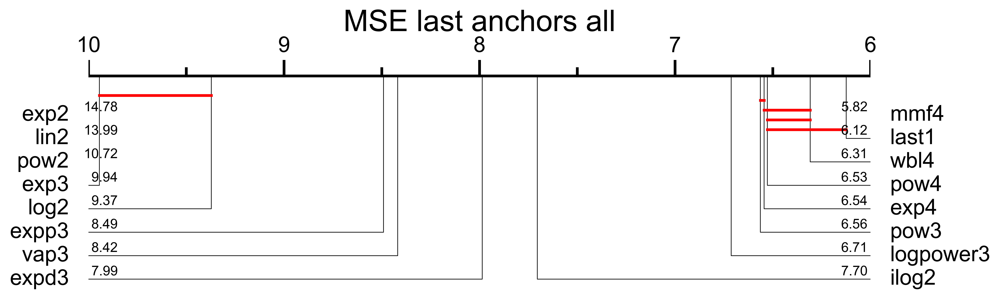

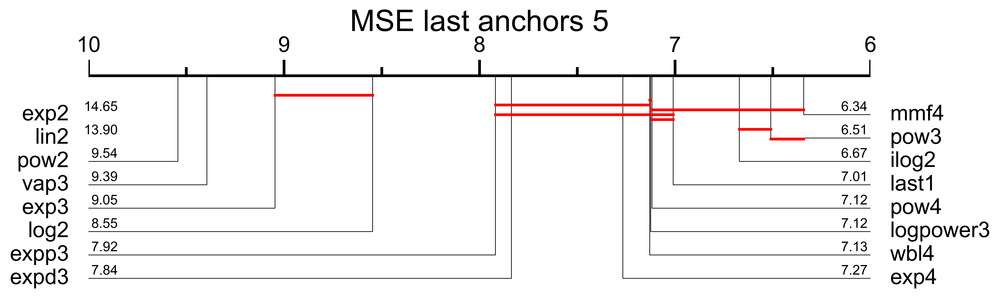

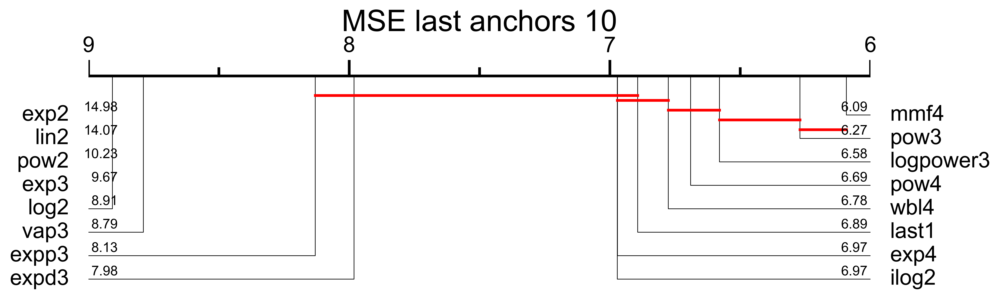

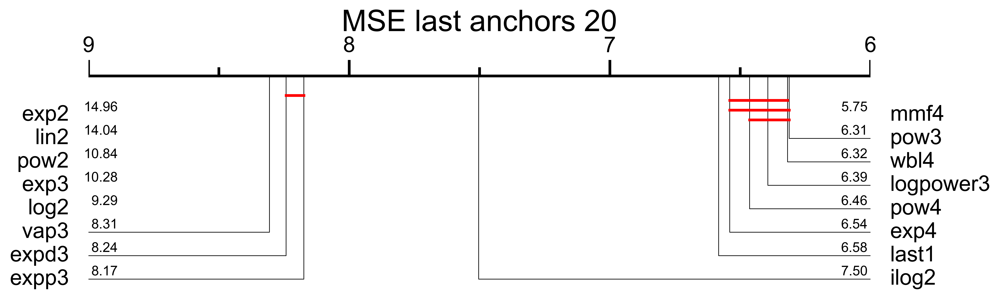

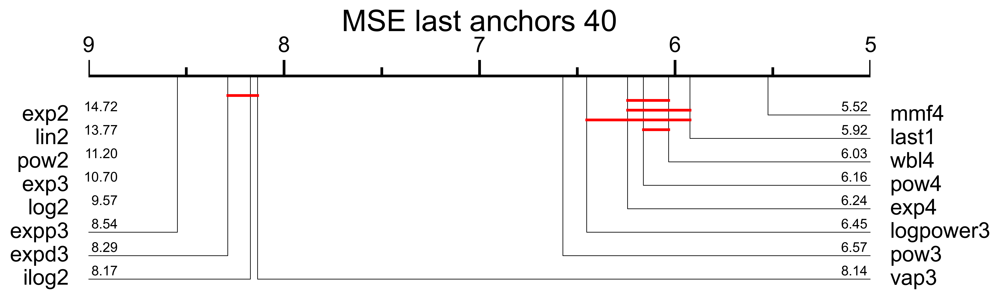

...

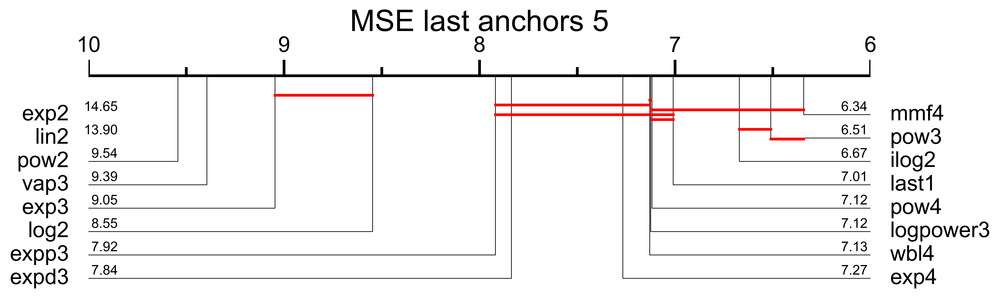

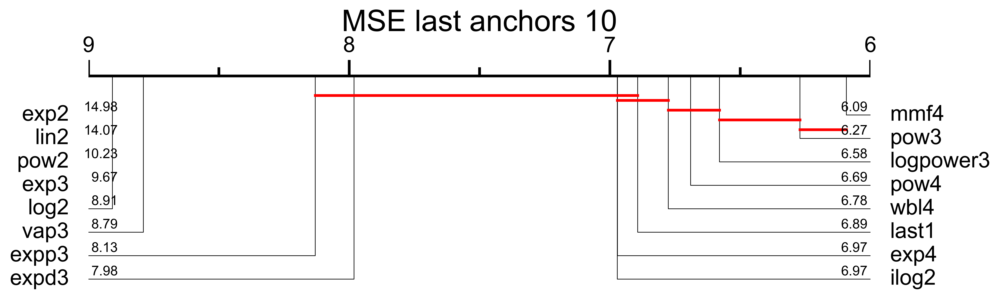

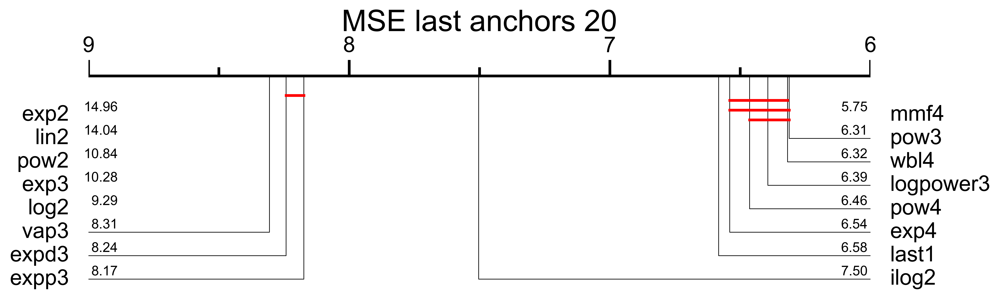

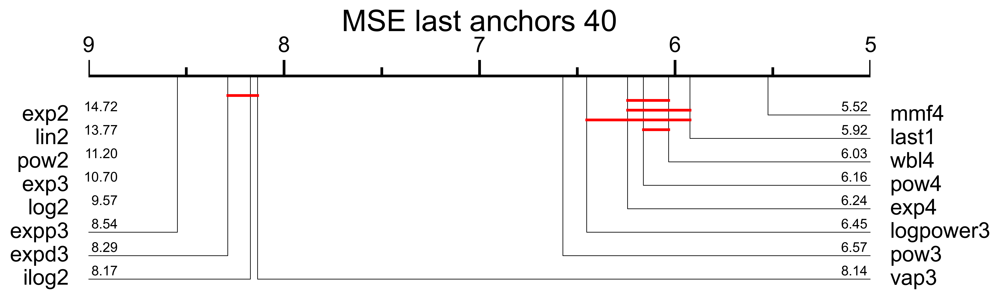

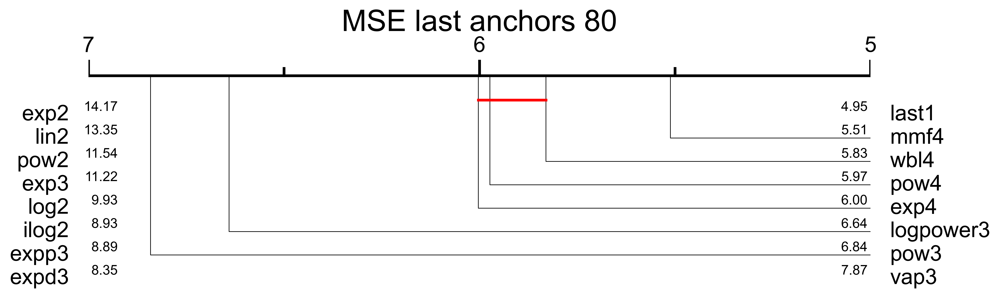

In [46]:
make_all_cd_plots(tables_MSE_tst_last,tables_MSE_tst_last_nan,'MSE last anchors','.eps', dir_plots)
make_all_cd_plots(tables_MSE_tst_last,tables_MSE_tst_last_nan,'MSE last anchors','.png', dir_plots)

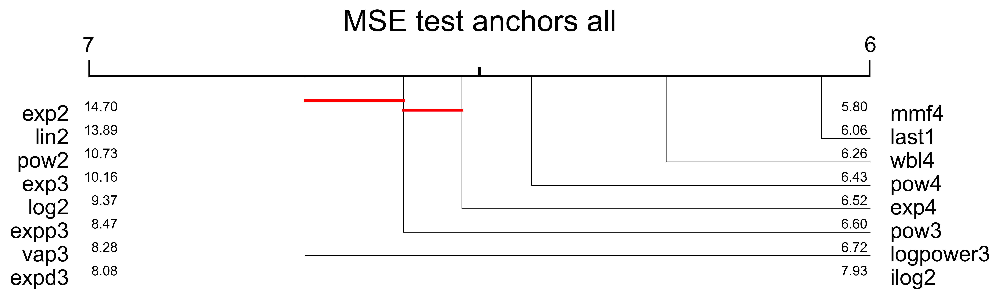

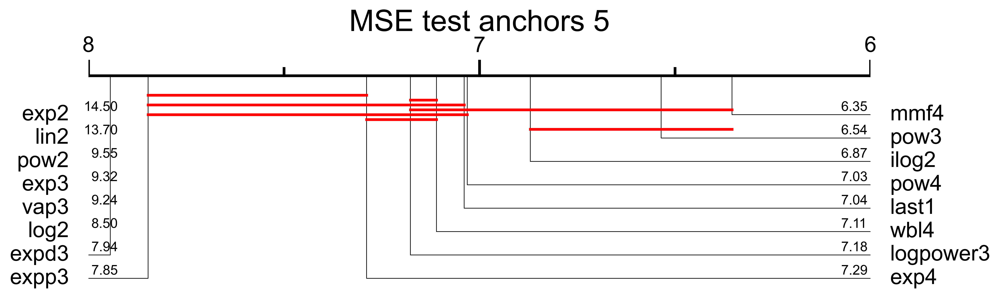

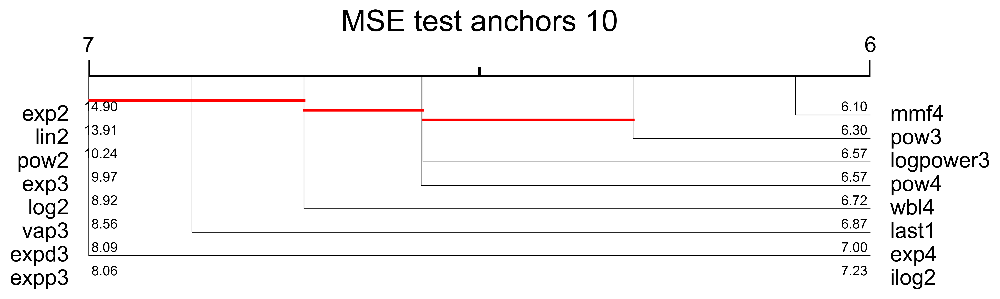

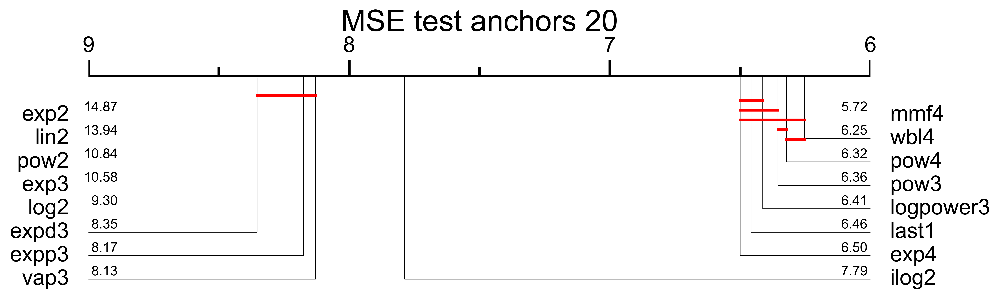

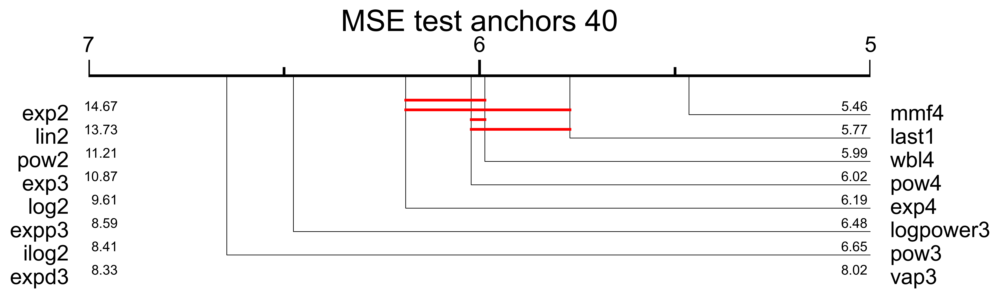

...

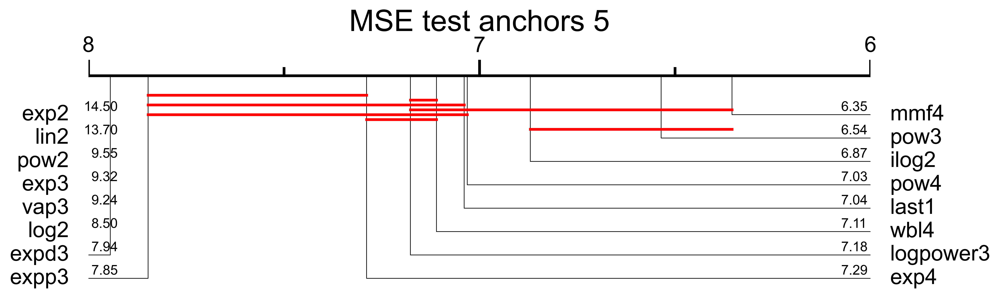

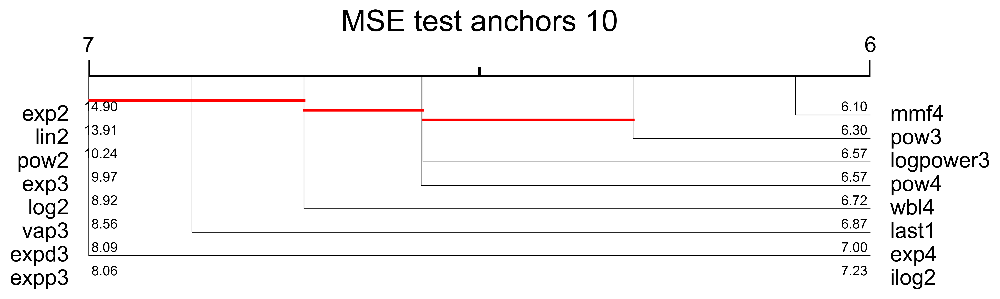

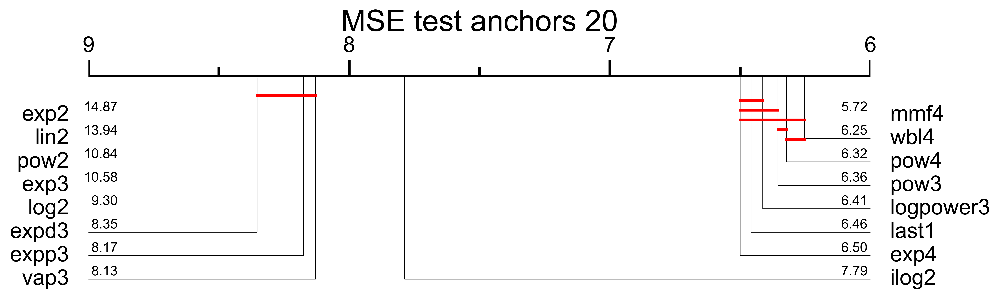

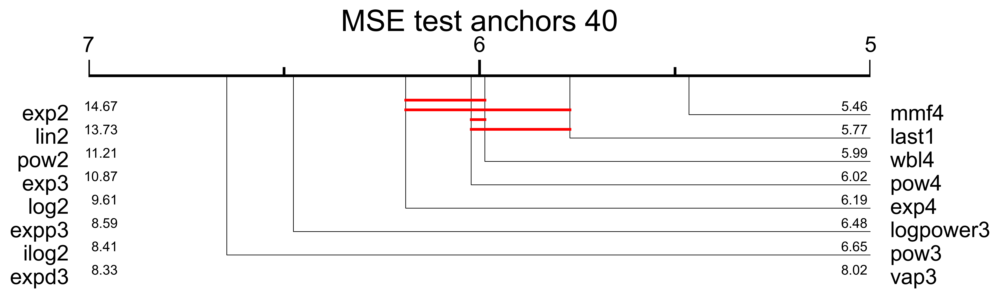

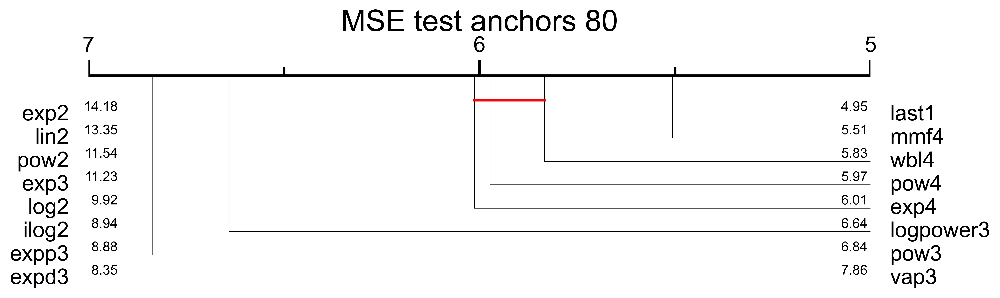

In [47]:
make_all_cd_plots(tables_MSE_tst,tables_MSE_tst_nan,'MSE test anchors','.eps',dir_plots)
make_all_cd_plots(tables_MSE_tst,tables_MSE_tst_nan,'MSE test anchors','.png',dir_plots)

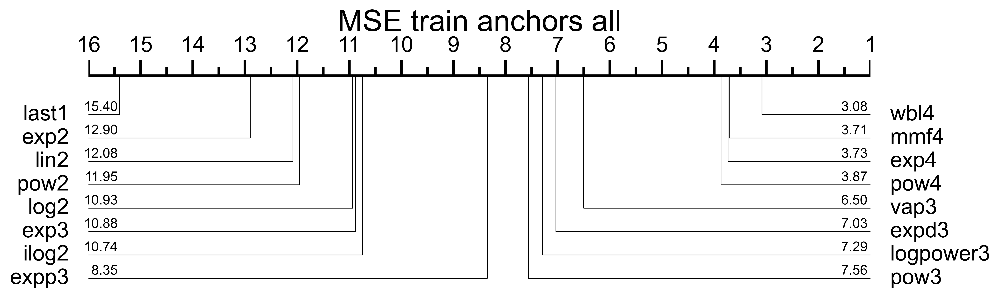

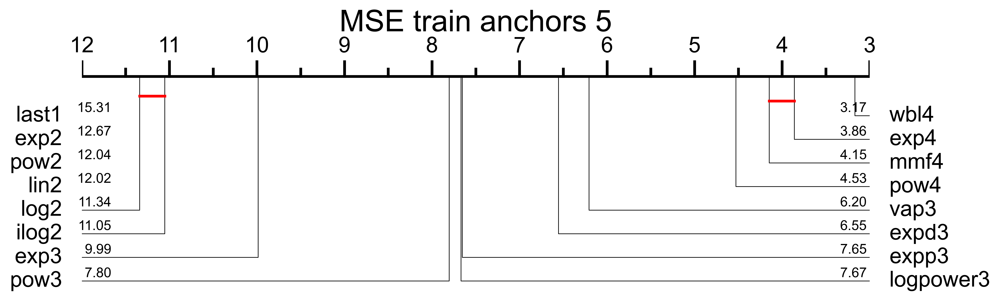

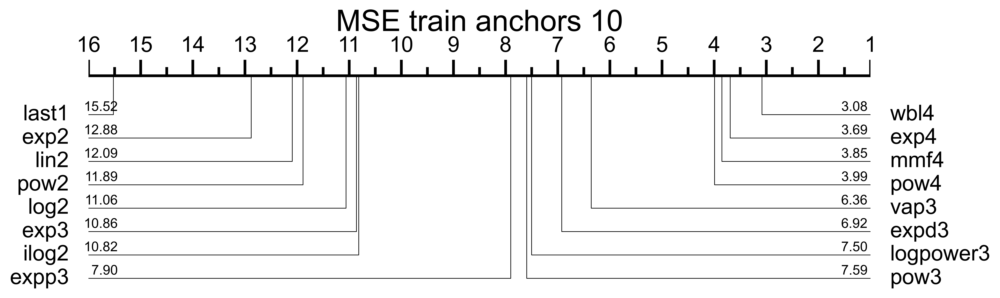

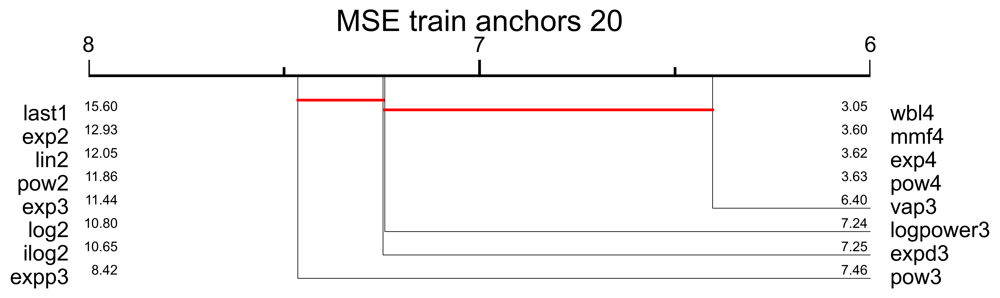

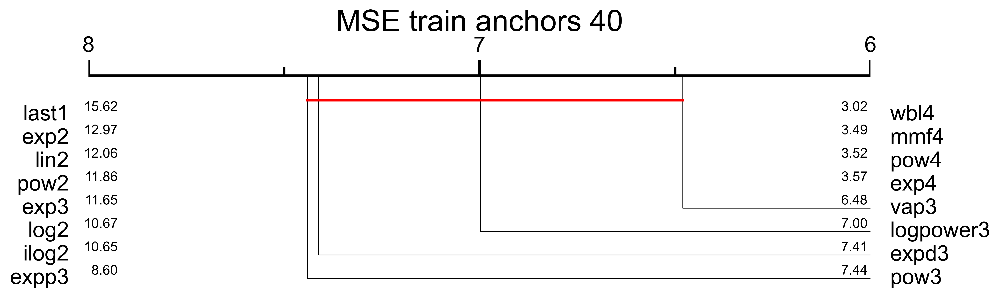

...

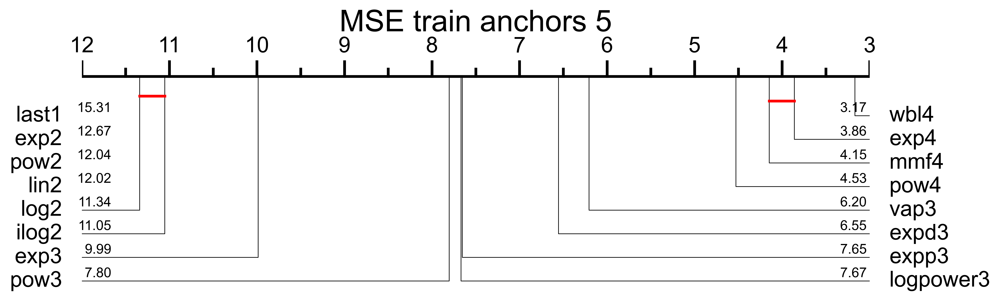

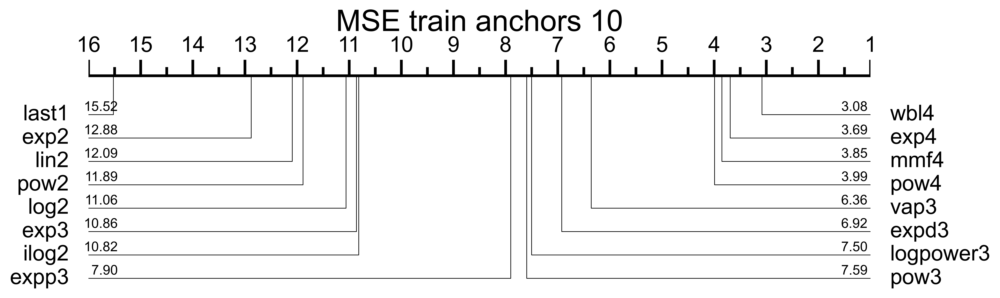

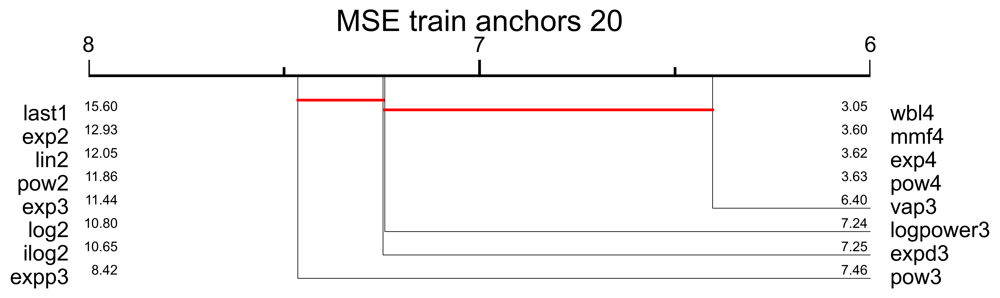

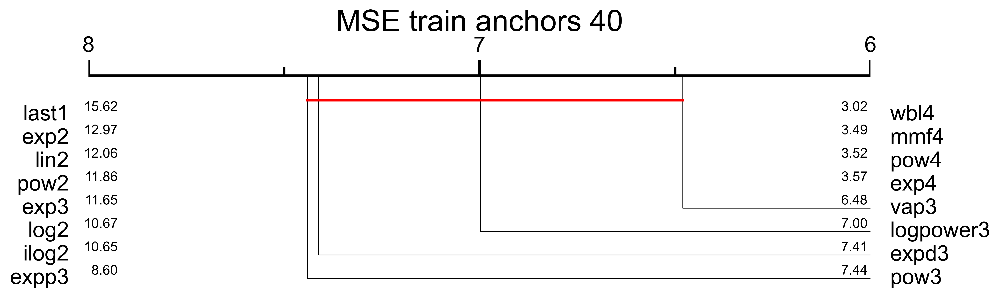

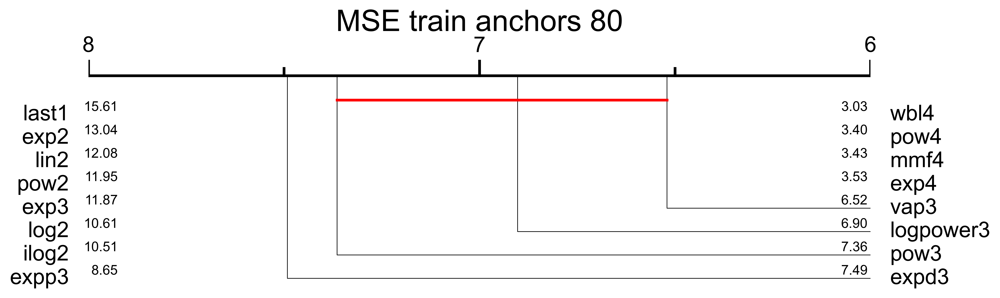

In [48]:
make_all_cd_plots(tables_MSE_trn,tables_MSE_trn_nan,'MSE train anchors','.eps', dir_plots)
make_all_cd_plots(tables_MSE_trn,tables_MSE_trn_nan,'MSE train anchors','.png', dir_plots)

# Visualize fit performances

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


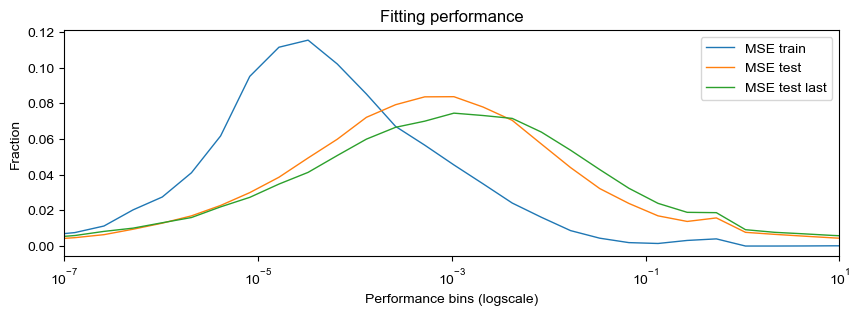

In [25]:

plt.figure(dpi=100,figsize=(10,3))

plot_metric(df_total['MSE_trn'],'MSE train')
plot_metric(df_total['MSE_tst'],'MSE test')
plot_metric(df_total['MSE_tst_last'],'MSE test last')

plt.xlabel('Performance bins (logscale)')
plt.ylabel('Fraction')
plt.legend()
plt.title('Fitting performance')
plt.xlim([1e-7,1e1])

plt.savefig(dir_plots + '/fitting_histogram.eps', bbox_inches='tight')
plt.savefig(dir_plots + '/fitting_histogram.png', bbox_inches='tight')
plt.show()

Preprocess the data for the CDF plot

In [26]:
max_possible_anchors = {
    d: max(df_total[df_total["openmlid"] == d]["max_anchor_seen"]) for d in pd.unique(df_total["openmlid"])
}

df_for_cdf_plot = df_total.copy()
df_for_cdf_plot["relevant_max_anchor"] = [get_relevant_max_anchor(max_possible_anchors[openmlid]) for openmlid in df_total["openmlid"]]

df_for_cdf_plot_filtered = df_for_cdf_plot[df_for_cdf_plot["max_anchor_seen"] == df_for_cdf_plot["relevant_max_anchor"]]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


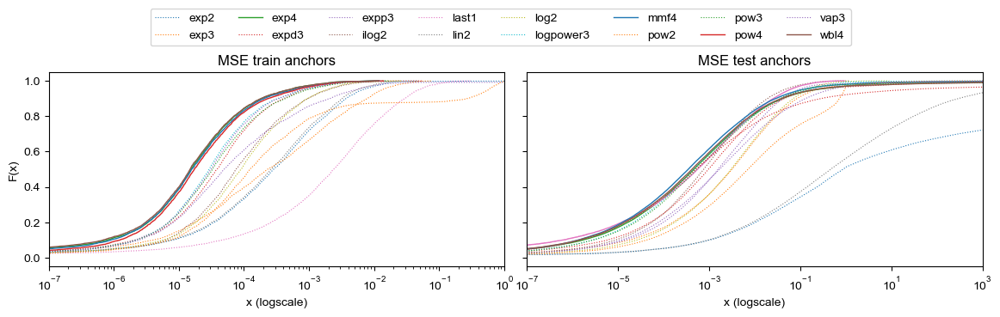

In [27]:
fig, (ax1, ax2) = plt.subplots(1, 2, dpi=100, sharey=True, figsize=(14,3))

lw_default = 0.8
ls_default = ":"

i = 0

winners_fit = ["pow4", "mmf4", "exp4", "wbl4"]
winners_extrapolate = ["mmf4", "exp4", "wbl4", "last1"]

for [curve_model, df_curve_model] in df_for_cdf_plot_filtered.groupby('curve_model'):

    #plot_metric(df_curve_model['MSE_tst'],curve_model,ls=ls)

    lw = 1 if curve_model in winners_fit else lw_default
    ls = "-" if curve_model in winners_fit else ls_default

    empirical_cdf(ax1,df_curve_model['MSE_trn'],curve_model,ls=ls,label=curve_model, linewidth=lw)
    i += 1
    ax1.set_xlabel('x (logscale)')
    ax1.set_xscale('log')
    ax1.set_xlim([1e-7,1])
    ax1.set_ylabel('F(x)')
    ax1.set_title('MSE train anchors')


i = 0
for [curve_model, df_curve_model] in df_total.groupby('curve_model'):

    #if i > 5:
    #   break
    lw = 1 if curve_model in winners_extrapolate else lw_default
    ls = "-" if curve_model in winners_extrapolate else ls_default

    #plot_metric(df_curve_model['MSE_tst'],curve_model,ls=ls)
    empirical_cdf(ax2,df_curve_model['MSE_tst_last'],curve_model,ls=ls,label=curve_model, linewidth=lw)
    i += 1

    ax2.set_xlabel('x (logscale)')
    ax2.set_title('MSE test anchors')
    ax2.set_xscale('log')
    ax2.set_xlim([1e-7,1e3])


handles, labels = ax1.get_legend_handles_labels()
lgd = fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=8)

plt.subplots_adjust(wspace=0.05)

plt.savefig(dir_plots + '/fitting_cdf.eps', bbox_inches='tight')
plt.savefig(dir_plots + '/fitting_cdf.png', bbox_inches='tight')
plt.show()

# Generate Latex
Generates a nice report on all fitting results in latex and compiles it with pdflatex.

In [57]:
with open("fit_report_start.tex") as f_start:
    with open("fit_report.tex", "w") as f_new:
        for line in f_start:
            f_new.write(line)

tables = [rank_table_tst_last,rank_table_tst,rank_table_trn]
captions = ['Ranks for extrapolating to the last test anchor.','Ranks for extrapolating to all test anchors.','Ranks for the training MSE.']
for i, table in enumerate(tables):
    print_pretty_rank_table_transpose(table, toFile='fit_report.tex', caption=captions[i])

with open('fit_report.tex',"a") as f:
    f.write('\\end{document}')

In [58]:
import subprocess

batcmd="pdflatex fit_report.tex"
result = subprocess.check_output(batcmd, shell=True, stderr=subprocess.STDOUT)
result

b"This is pdfTeX, Version 3.141592653-2.6-1.40.24 (MiKTeX 21.12) (preloaded format=pdflatex.fmt)\r\n restricted \\write18 enabled.\r\nentering extended mode\r\n(fit_report.tex\r\nLaTeX2e <2021-11-15> patch level 1\r\nL3 programming layer <2021-11-22>\r\n(C:\\Users\\tjviering\\AppData\\Local\\Programs\\MiKTeX\\tex/latex/base\\article.cls\r\nDocument Class: article 2021/10/04 v1.4n Standard LaTeX document class\r\n(C:\\Users\\tjviering\\AppData\\Local\\Programs\\MiKTeX\\tex/latex/base\\size10.clo))\r\n(C:\\Users\\tjviering\\AppData\\Local\\Programs\\MiKTeX\\tex/generic/babel\\babel.sty\r\n(C:\\Users\\tjviering\\AppData\\Local\\Programs\\MiKTeX\\tex/generic/babel\\txtbabel.de\r\nf)\r\n*************************************\r\n* Local config file bblopts.cfg used\r\n*\r\n(C:\\Users\\tjviering\\AppData\\Local\\Programs\\MiKTeX\\tex/latex/arabi\\bblopts.cfg)\r\n(C:\\Users\\tjviering\\AppData\\Local\\Programs\\MiKTeX\\tex/latex/babel-english\\engli\r\nsh.ldf))\r\n(C:\\Users\\tjviering\\AppData